<a href="https://colab.research.google.com/github/shaikh-shahnawaz-21/face-detection_img-video.ipynb/blob/main/face_detection_img%26video.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opencv-python
!pip install opencv-python-headless


In [2]:
import cv2
import matplotlib.pyplot as plt


In [3]:
# Download Haar cascade file
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml


--2025-06-23 18:23:38--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.06s   

2025-06-23 18:23:38 (15.6 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]



In [4]:
from google.colab import files
uploaded = files.upload()


Saving WhatsApp Image 2025-06-15 at 8.16.46 PM.jpeg to WhatsApp Image 2025-06-15 at 8.16.46 PM.jpeg


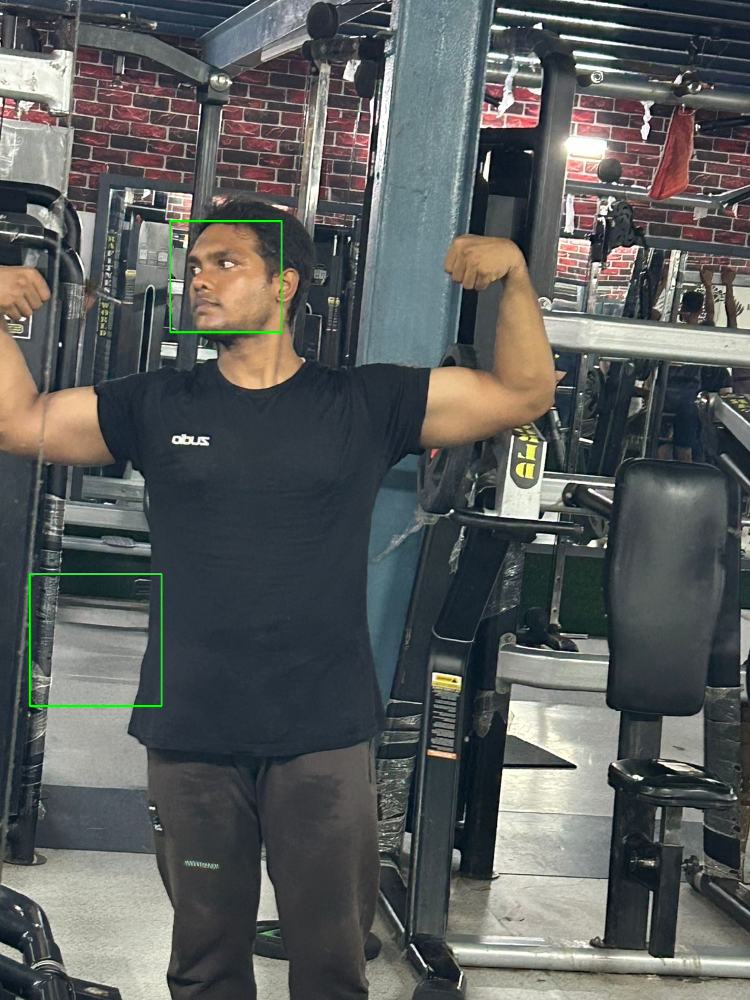

In [40]:
import cv2
from google.colab.patches import cv2_imshow  # 👈 important for Colab

# Load face cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load image
img = cv2.imread('/content/WhatsApp Image 2025-06-15 at 8.16.46 PM.jpeg')  # 👈 replace with your image path
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
# Detect only larger faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=3, minSize=(100, 100))


# Draw rectangles
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Show image (Colab-safe)
cv2_imshow(img)


In [31]:
from google.colab import files
uploaded = files.upload()


Saving WhatsApp Video 2025-06-15 at 8.16.46 PM.mp4 to WhatsApp Video 2025-06-15 at 8.16.46 PM.mp4


In [32]:
import os
video_path = list(uploaded.keys())[0]
print("Video uploaded:", video_path)


Video uploaded: WhatsApp Video 2025-06-15 at 8.16.46 PM.mp4


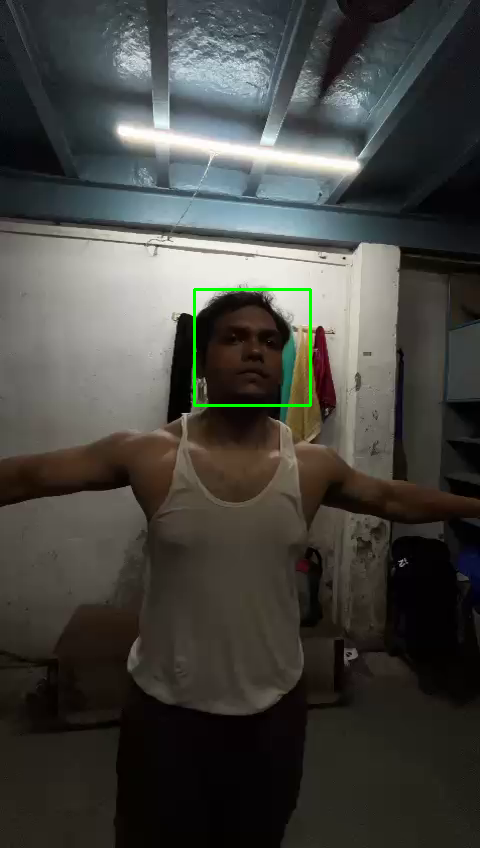

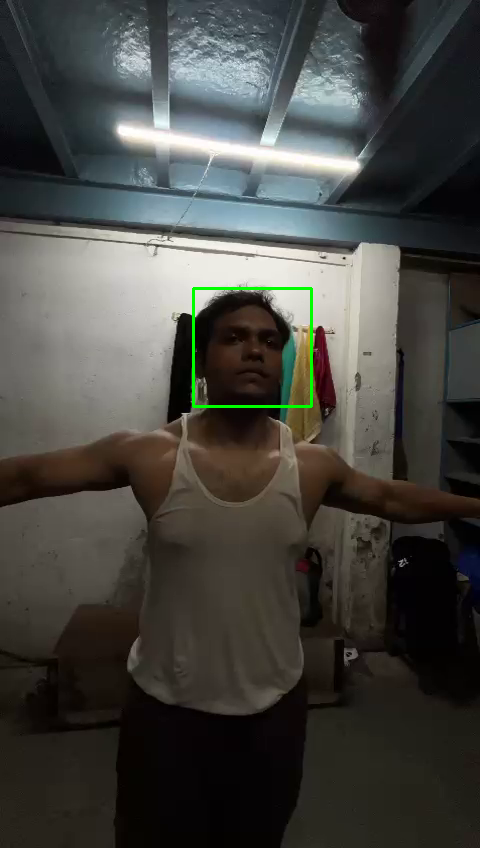

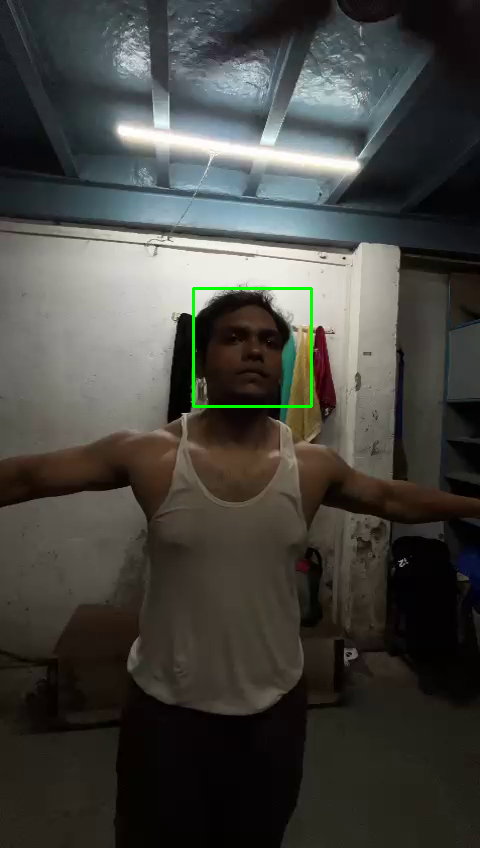

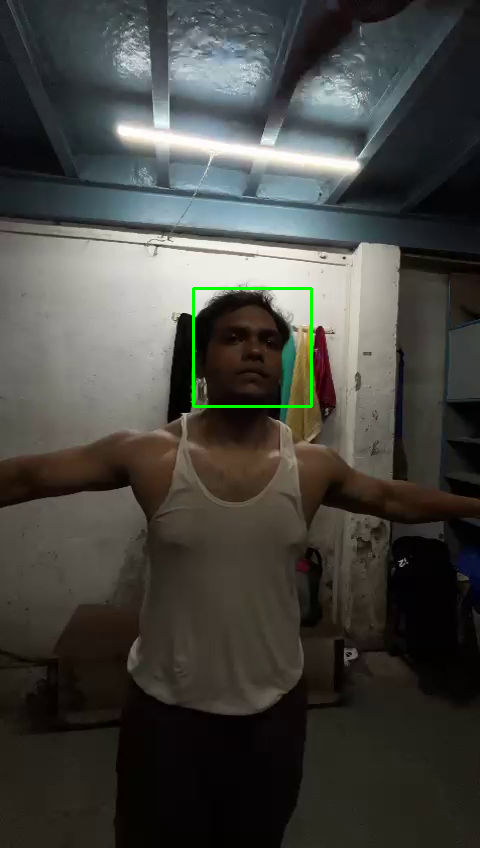

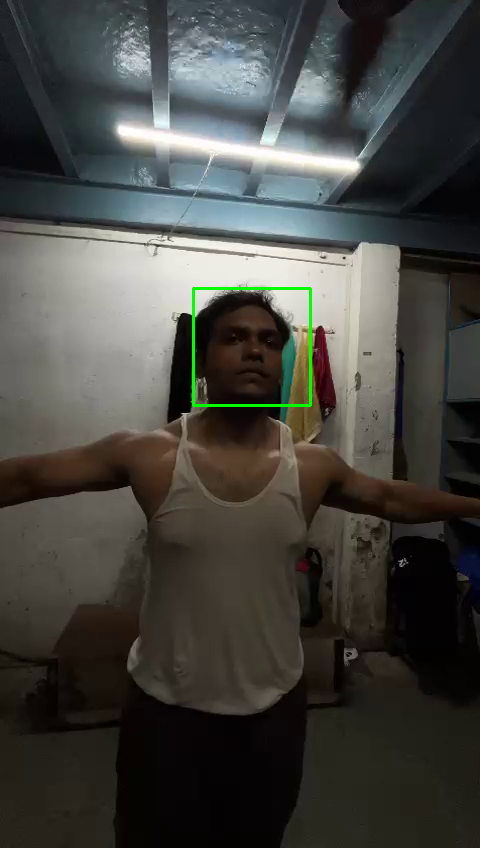

...

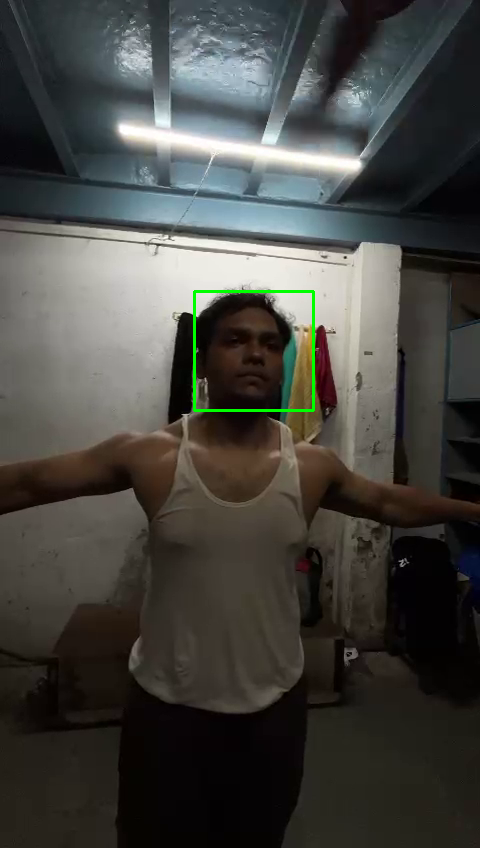

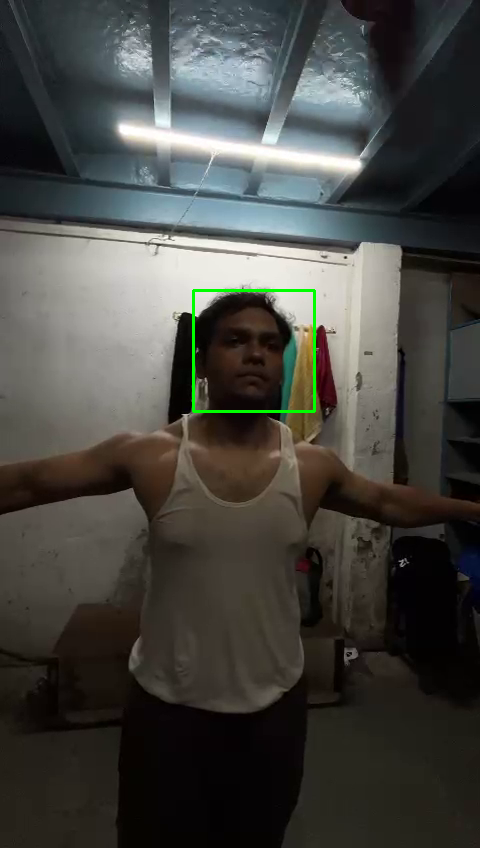

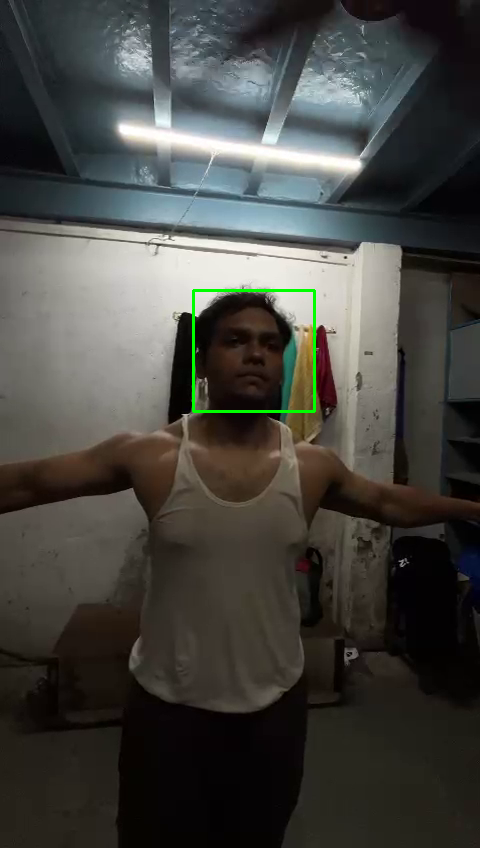

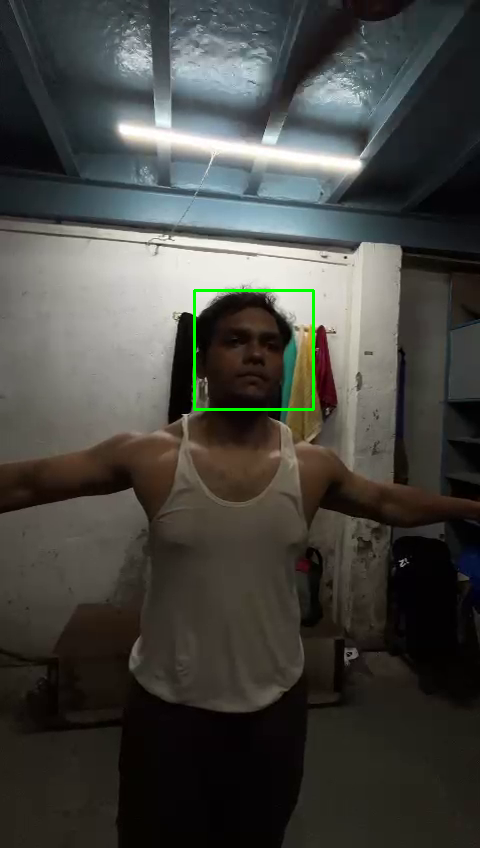

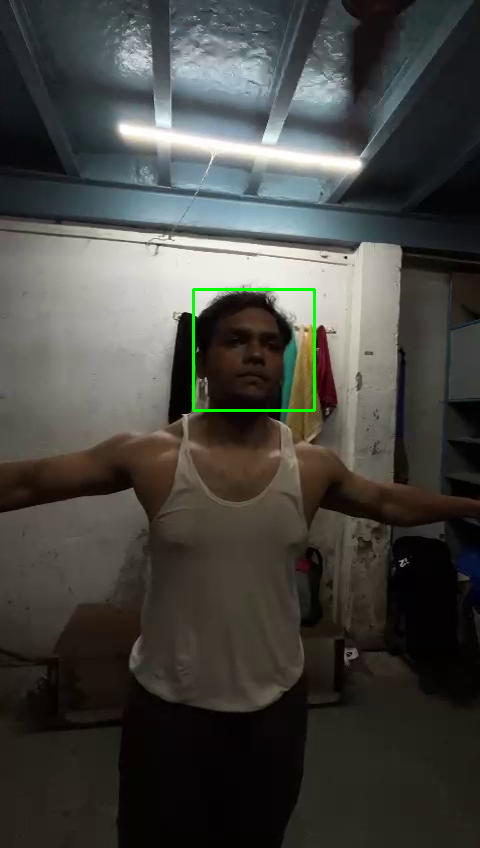

In [36]:
import cv2
from google.colab.patches import cv2_imshow

# Load face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Load video
cap = cv2.VideoCapture('/content/WhatsApp Video 2025-06-15 at 8.16.46 PM.mp4')  # replace with your video filename

frame_count = 0
max_frames = 30  # Show only first 30 frames to avoid overload

while True:
    ret, frame = cap.read()
    if not ret or frame_count >= max_frames:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=6, minSize=(60, 60))

    # Draw rectangles
    for (x, y, w, h) in faces:
        padding = 20
        x_pad = max(x - padding, 0)
        y_pad = max(y - padding, 0)
        w_pad = w + 2 * padding
        h_pad = h + 2 * padding
        cv2.rectangle(frame, (x_pad, y_pad), (x_pad + w_pad, y_pad + h_pad), (0, 255, 0), 2)

    # Show frame in Colab
    cv2_imshow(frame)
    frame_count += 1

cap.release()
